In [1]:
import pandas as pd
import numpy as np
import plotly.express as px
from sklearn.model_selection import train_test_split

In [3]:
data = pd.read_csv('deliverytime.txt')

In [15]:
#Earth's Radius
R = 6371

def deg_to_rad(degrees):
    return degrees* (np.pi/180)

def distcalculate(lat1, lon1, lat2, lon2):
    d_lat = deg_to_rad(lat2-lat1)
    d_lon = deg_to_rad(lon2-lon1)
    a=np.sin(d_lat/2)**2 + np.cos(deg_to_rad(lat1))*np.cos(deg_to_rad(lat2))*np.sin(d_lon/2)**2
    c = 2* np.arctan2(np.sqrt(a), np.sqrt(1-a))
    return R*c

data['distance'] = np.nan

for i in range(len(data)):
    data.loc[i, 'distance'] = distcalculate(data.loc[i, 'Restaurant_latitude'], 
                                        data.loc[i, 'Restaurant_longitude'], 
                                        data.loc[i, 'Delivery_location_latitude'], 
                                        data.loc[i, 'Delivery_location_longitude'])

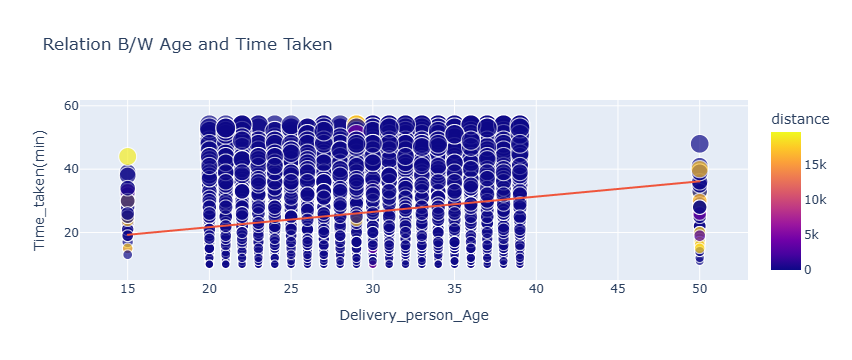

In [25]:
fig = px.scatter(data_frame = data,
                x="Delivery_person_Age",
                y="Time_taken(min)",
                size="Time_taken(min)",
                 color="distance",
                trendline="ols",
                title="Relation B/W Age and Time Taken")

fig.show()

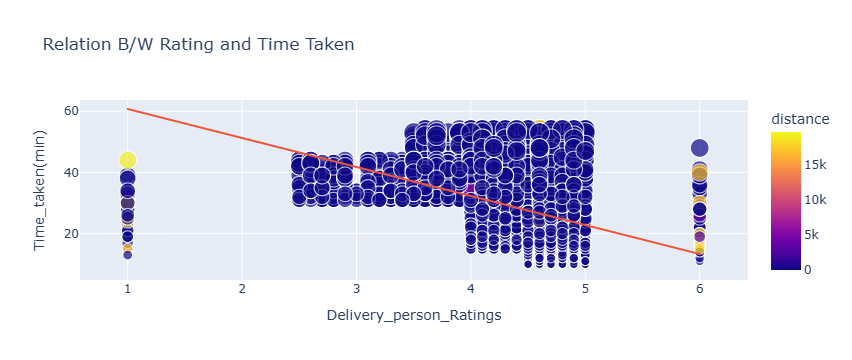

In [27]:
fig = px.scatter(data_frame = data,
                x="Delivery_person_Ratings",
                y="Time_taken(min)",
                size="Time_taken(min)",
                 color="distance",
                trendline="ols",
                title="Relation B/W Rating and Time Taken")

fig.show()

In [35]:
x = np.array(data[["Delivery_person_Age",
                  "Delivery_person_Ratings",
                  "distance"]])
y = np.array(data[["Time_taken(min)"]])

X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.10, random_state = 42)

#Creating LSTM neural network
from keras.models import Sequential
from keras.layers import Dense, LSTM

model = Sequential()
model.add(LSTM(128, return_sequences=True, input_shape=(X_train.shape[1],1)))
model.add(LSTM(64, return_sequences=False))
model.add(Dense(25))
model.add(Dense(1))
model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm (LSTM)                 (None, 3, 128)            66560     
                                                                 
 lstm_1 (LSTM)               (None, 64)                49408     
                                                                 
 dense (Dense)               (None, 25)                1625      
                                                                 
 dense_1 (Dense)             (None, 1)                 26        
                                                                 
Total params: 117,619
Trainable params: 117,619
Non-trainable params: 0
_________________________________________________________________


In [41]:
print("Food Delivery Time Prediction")
a = int(input("Age of Delivery partner: "))
b = float(input("Rating of Previous Deliveries: "))
c =int(input("Total Distance: "))

features = np.array([[a,b,c]])
print("Predicted Delivery Time = ", model.predict(features))

Food Delivery Time Prediction


Age of Delivery partner:  29
Rating of Previous Deliveries:  3.1
Total Distance:  6


1/1 [==============================] - 1s 880ms/step
Predicted Delivery Time =  [[39.493183]]
